In [1]:
#importing libraries
#pandas and numpy for data manipulation
import numpy as np
import pandas as pd

#matplotlib and seaborn for data visualization
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
#sns.set(font_scale = 2)


#importing warnings to ignore warnings
import warnings
warnings.filterwarnings('ignore')


#importing stats from scipy
from scipy import stats

#Displaying all columns
pd.set_option('display.max_columns',None)

In [2]:
#loading data file
data=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv')

#display top of dataset
data.head()


,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
#Display the shape of dataset 
data.shape
print('The data set has ',data.shape[0],'rows and ',data.shape[1],'columns.')

The data set has  7752 rows and  25 columns.


In [4]:
print('\nData Types of data set attributes---->')
data.dtypes


Data Types of data set attributes---->


station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [5]:
## So converting 'Date' datatype from object type to date
#Pre-processing
data['present_day']=pd.to_datetime(data['Date'])

data['Month']=data['present_day'].dt.month
data['Day']=data['present_day'].dt.day
data['Year']=data['present_day'].dt.year


# Dropping 'Date'
data.drop(['Date','present_day'],inplace=True,axis=1)

In [6]:
#Checking for duplicate data
data.duplicated().sum()

0

In [7]:
## Checking for null values in dataset
data.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
Month                2
Day                  2
Year                 2
dtype: int64

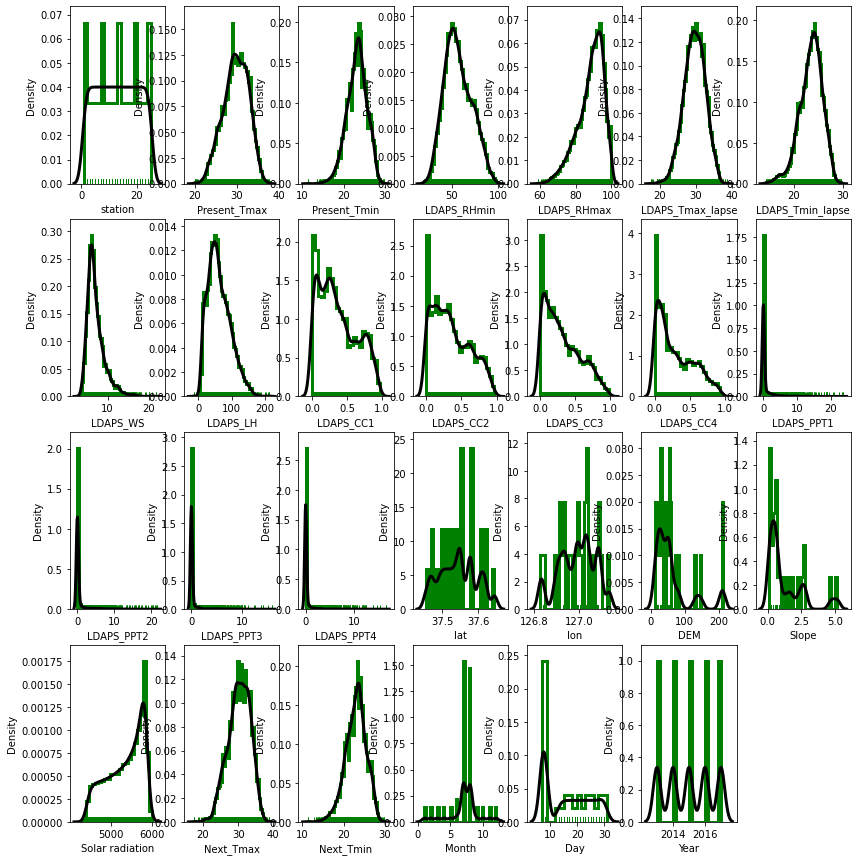

In [8]:
## Plotting for distribution plot

a= 4  # no. of rows
b= 7  # no. of columns
c= 1   # initializing plot index
fig = plt.figure(figsize=(14,15))

for i in data.columns:
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.distplot(data[i],rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 3, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 3,
                            "alpha": 1, "color": "g"})
    c = c + 1

plt.show()

In [9]:
## Checking for unique values of each attributes:

print('No. of Unique values in each attribute------')
data.apply(lambda x: len(x.unique()))

No. of Unique values in each attribute------


station               26
Present_Tmax         168
Present_Tmin         156
LDAPS_RHmin         7673
LDAPS_RHmax         7665
LDAPS_Tmax_lapse    7676
LDAPS_Tmin_lapse    7676
LDAPS_WS            7676
LDAPS_LH            7676
LDAPS_CC1           7570
LDAPS_CC2           7583
LDAPS_CC3           7600
LDAPS_CC4           7525
LDAPS_PPT1          2813
LDAPS_PPT2          2511
LDAPS_PPT3          2357
LDAPS_PPT4          1919
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            184
Next_Tmin            158
Month                 13
Day                   22
Year                   6
dtype: int64

In [10]:
data.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,6.0,30.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,6.0,30.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,6.0,30.0,2013.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,6.0,30.0,2013.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,6.0,30.0,2013.0


In [11]:
#Looking on to distribution plot following observations arev witnessed for replacing missing values:
    #1. replacing station with mode of data.
data['station']=data['station'].fillna(data['station'].mode()[0])
    #2. replacing null values in Present_Tmax with mean of data.
data['Present_Tmax']=data['Present_Tmax'].fillna(data['Present_Tmax'].mean())
    #3. replacing null values in Present_Tmin with mean of data.
data['Present_Tmin']=data['Present_Tmin'].fillna(data['Present_Tmin'].mean())                                                
    #4. replacing null values in LDAPS_RHmin with mean of data.
data['LDAPS_RHmin']=data['LDAPS_RHmin'].fillna(data['LDAPS_RHmin'].mean())                                                  
    #5. replacing null values in LDAPS_RHmax with median of data.
data['LDAPS_RHmax']=data['LDAPS_RHmax'].fillna(data['LDAPS_RHmax'].median())       
    #6. replacing null values in LDAPS_Tmax_lapse with mean of data.
data['LDAPS_Tmax_lapse']=data['LDAPS_Tmax_lapse'].fillna(data['LDAPS_Tmax_lapse'].mean())                                                  
    #7. replacing null values in LDAPS_Tmin_lapse with mean of data.
data['LDAPS_Tmin_lapse']=data['LDAPS_Tmin_lapse'].fillna(data['LDAPS_Tmin_lapse'].mean())                                                  
    #8. replacing null values in LDAPS_WS with median of data.
data['LDAPS_WS']=data['LDAPS_WS'].fillna(data['LDAPS_WS'].median())     
    #9. replacing null values in LDAPS_LH with median of data.
data['LDAPS_LH']=data['LDAPS_LH'].fillna(data['LDAPS_LH'].median()) 
    #10.replacing null values in LDAPS_LH with mean of data.
data['LDAPS_LH']=data['LDAPS_LH'].fillna(data['LDAPS_LH'].mean())                                                  
    #11.replacing null values in LDAPS_CC1 with median of data.
data['LDAPS_CC1']=data['LDAPS_CC1'].fillna(data['LDAPS_CC1'].median()) 
    #12.replacing null values in LDAPS_CC2 with median of data.
data['LDAPS_CC2']=data['LDAPS_CC2'].fillna(data['LDAPS_CC2'].median()) 
    #13.replacing null values in LDAPS_CC3 with median of data.
data['LDAPS_CC3']=data['LDAPS_CC3'].fillna(data['LDAPS_CC3'].median()) 
    #14.replacing null values in LDAPS_CC4 with median of data.
data['LDAPS_CC4']=data['LDAPS_CC4'].fillna(data['LDAPS_CC4'].median()) 
    #15.replacing null values in LDAPS_PPT1 with median of data.
data['LDAPS_PPT1']=data['LDAPS_PPT1'].fillna(data['LDAPS_PPT1'].median()) 
    #16.replacing null values in LDAPS_PPT2 with median of data.
data['LDAPS_PPT2']=data['LDAPS_PPT2'].fillna(data['LDAPS_PPT2'].median()) 
    #17.replacing null values in LDAPS_PPT3 with median of data.
data['LDAPS_PPT3']=data['LDAPS_PPT3'].fillna(data['LDAPS_PPT3'].median()) 
    #18.replacing null values in LDAPS_PPT4 with median of data.
data['LDAPS_PPT4']=data['LDAPS_PPT4'].fillna(data['LDAPS_PPT4'].median()) 
    #19.replacing null values in Next_Tmax with mean of data.
data['Next_Tmax']=data['Next_Tmax'].fillna(data['Next_Tmax'].mean())                                                  
    #20.replacing null values in Next_Tmin with mean of data.
data['Next_Tmin']=data['Next_Tmin'].fillna(data['Next_Tmin'].mean())                                                  
    #21.replacing null values in Month with mode of data.
data['Month']=data['Month'].fillna(data['Month'].mode()[0])                                           
    #22.replacing null values in Day with mode of data.
data['Day']=data['Day'].fillna(data['Day'].mode()[0])                                           
    #23.replacing null values in Year with mode of data.
data['Year']=data['Year'].fillna(data['Year'].mode()[0])                                           


In [12]:
#Checking for null values after filling null values

print('Missing values after filling null values--->')
data.isnull().sum()

Missing values after filling null values--->


station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Month               0
Day                 0
Year                0
dtype: int64

In [13]:
print('The stats of the data: ')
data.describe()

The stats of the data: 


,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.996904,29.768211,23.225059,56.759372,88.388529,29.613447,23.512589,7.092549,62.450457,0.368260,0.355658,0.317864,0.298499,0.586267,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,7.080624,16.368550,2014.999484
std,7.213213,2.956557,2.403036,14.596973,7.158471,2.932898,2.333973,2.173913,33.571540,0.261236,0.256845,0.249208,0.253211,1.937198,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276,2.238075,8.241642,1.414487
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,1.000000,7.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,0.142328,0.103100,0.082741,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000,7.000000,8.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.313244,89.793480,29.662273,23.735942,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,7.000000,16.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.049122,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,8.000000,24.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,12.000000,31.000000,2017.000000


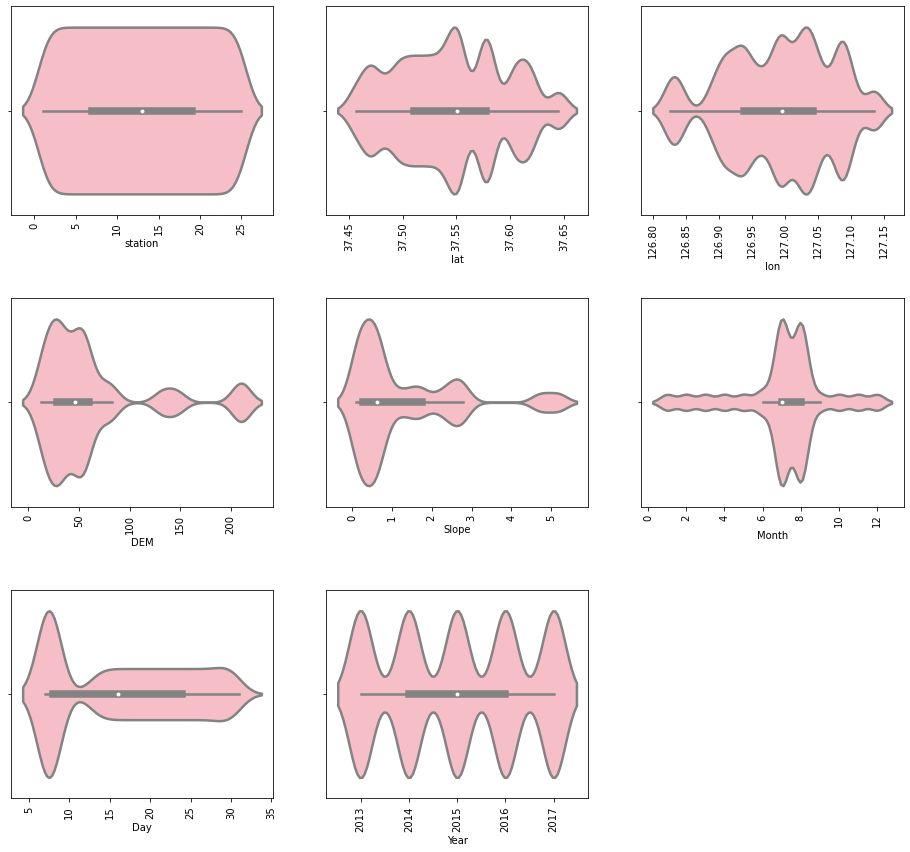

In [14]:
cat_var=['station','lat','lon','DEM','Slope','Month','Day','Year']

a= 3  # no. of rows
b= 3  # no. of columns
c= 1   # initializing plot index
fig = plt.figure(figsize=(16,8))
for var in cat_var:
    plt.subplot(a, b, c)
    plt.xlabel(i)
    ax=sns.violinplot(data[var],edgecolor=".2",linewidth=2.5,color='lightpink')
    plt.xticks(rotation=90)
    for j in ax.patches:
        ax.annotate(int(j.get_height()),(j.get_x()+0.22,j.get_height()+5), va='bottom',color='black')
    c = c + 1
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 1.5)
plt.show() 

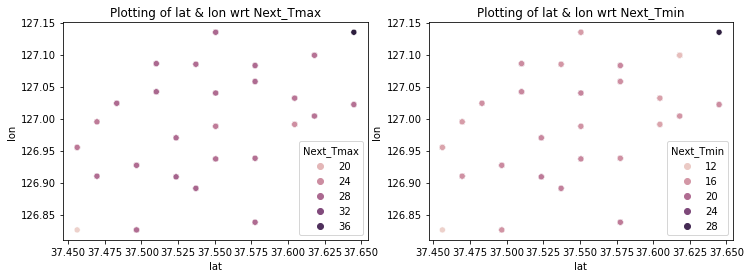

In [15]:
#Bivariate plot
plt.figure(figsize=(12,4))
plt.title('Plotting of lat and lon wrt output variable')
plt.subplot(121)
sns.scatterplot(x='lat',y='lon',data=data,hue='Next_Tmax')
plt.title('Plotting of lat & lon wrt Next_Tmax')
plt.subplot(122)
sns.scatterplot(x='lat',y='lon',data=data,hue='Next_Tmin')
plt.title('Plotting of lat & lon wrt Next_Tmin')


plt.show()

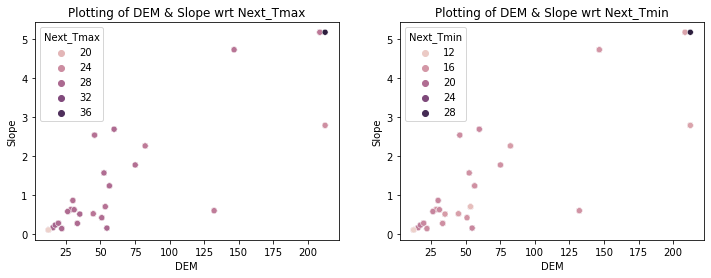

In [16]:
#Bivariate plot
plt.figure(figsize=(12,4))
plt.title('Plotting of DEM & Slope wrt output variable')
plt.subplot(121)
sns.scatterplot(x='DEM',y='Slope',data=data,hue='Next_Tmax')
plt.title('Plotting of DEM & Slope wrt Next_Tmax')

plt.subplot(122)
sns.scatterplot(x='DEM',y='Slope',data=data,hue='Next_Tmin')
plt.title('Plotting of DEM & Slope wrt Next_Tmin')


plt.show()

<AxesSubplot:xlabel='Day', ylabel='station'>

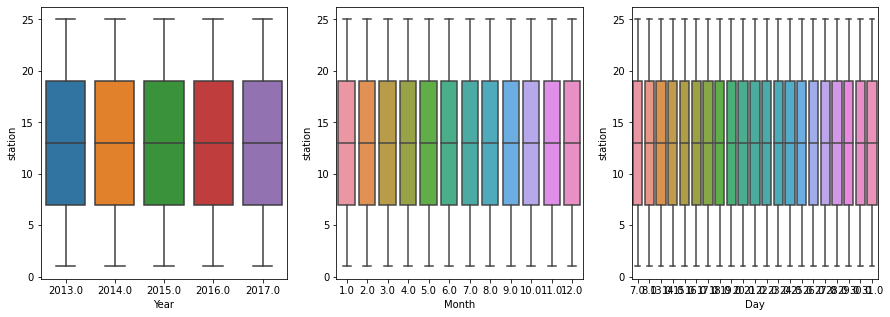

In [17]:

plt.figure(figsize=(15,5))
plt.subplot(131)
sns.boxplot(x='Year',y='station',data=data)
plt.subplot(132)
sns.boxplot(x='Month',y='station',data=data)
plt.subplot(133)
sns.boxplot(x='Day',y='station',data=data)

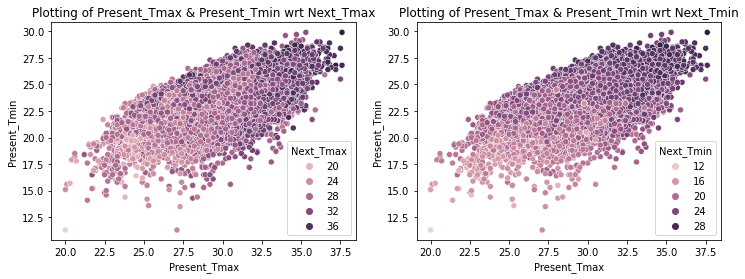

In [18]:
#Bivariate plot of Present_Tmax & Present_Tmin
plt.figure(figsize=(12,4))

plt.subplot(121)
sns.scatterplot(x='Present_Tmax',y='Present_Tmin',data=data,hue='Next_Tmax')
plt.title('Plotting of Present_Tmax & Present_Tmin wrt Next_Tmax')

plt.subplot(122)
sns.scatterplot(x='Present_Tmax',y='Present_Tmin',data=data,hue='Next_Tmin')
plt.title('Plotting of Present_Tmax & Present_Tmin wrt Next_Tmin')


plt.show()

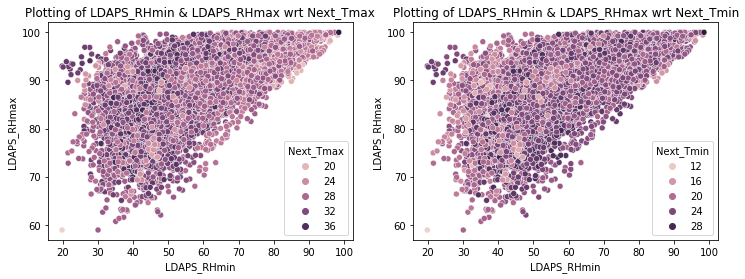

In [19]:
#Bivariate plot of LDAPS_RHmin & LDAPS_RHmax
plt.figure(figsize=(12,4))

plt.subplot(121)
sns.scatterplot(x='LDAPS_RHmin',y='LDAPS_RHmax',data=data,hue='Next_Tmax')
plt.title('Plotting of LDAPS_RHmin & LDAPS_RHmax wrt Next_Tmax')

plt.subplot(122)
sns.scatterplot(x='LDAPS_RHmin',y='LDAPS_RHmax',data=data,hue='Next_Tmin')
plt.title('Plotting of LDAPS_RHmin & LDAPS_RHmax wrt Next_Tmin')


plt.show()

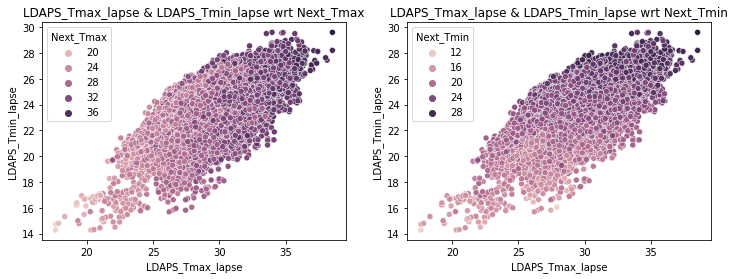

In [20]:

#Bivariate plot of LDAPS_Tmax_lapse & LDAPS_Tmin_lapse
plt.figure(figsize=(12,4))

plt.subplot(121)
sns.scatterplot(x='LDAPS_Tmax_lapse',y='LDAPS_Tmin_lapse',data=data,hue='Next_Tmax')
plt.title('LDAPS_Tmax_lapse & LDAPS_Tmin_lapse wrt Next_Tmax')

plt.subplot(122)
sns.scatterplot(x='LDAPS_Tmax_lapse',y='LDAPS_Tmin_lapse',data=data,hue='Next_Tmin')
plt.title('LDAPS_Tmax_lapse & LDAPS_Tmin_lapse wrt Next_Tmin')

plt.show()

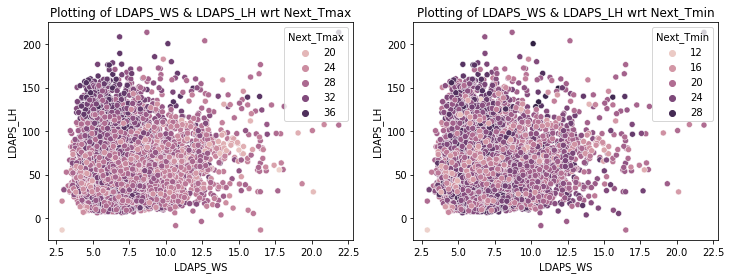

In [21]:
#Bivariate plot of 'LDAPS_WS','LDAPS_LH'
plt.figure(figsize=(12,4))

plt.subplot(121)
sns.scatterplot(x='LDAPS_WS',y='LDAPS_LH',data=data,hue='Next_Tmax')
plt.title('Plotting of LDAPS_WS & LDAPS_LH wrt Next_Tmax')

plt.subplot(122)
sns.scatterplot(x='LDAPS_WS',y='LDAPS_LH',data=data,hue='Next_Tmin')
plt.title('Plotting of LDAPS_WS & LDAPS_LH wrt Next_Tmin')


plt.show()

In [22]:
##Checking for correlation of output variable with other attributes:
corr_matrix=data.corr()

<AxesSubplot:>

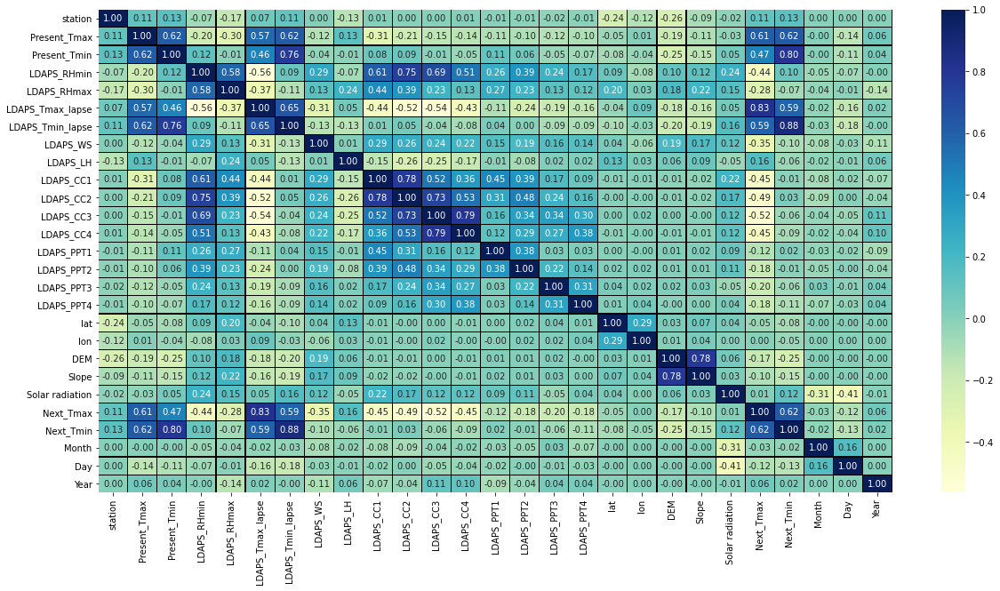

In [23]:
#Graphical Visualization of correlation 
plt.figure(figsize=(20,10))
sns.heatmap(corr_matrix,annot=True,linecolor='black',fmt='.2f',linewidths=0.1,cmap="YlGnBu")

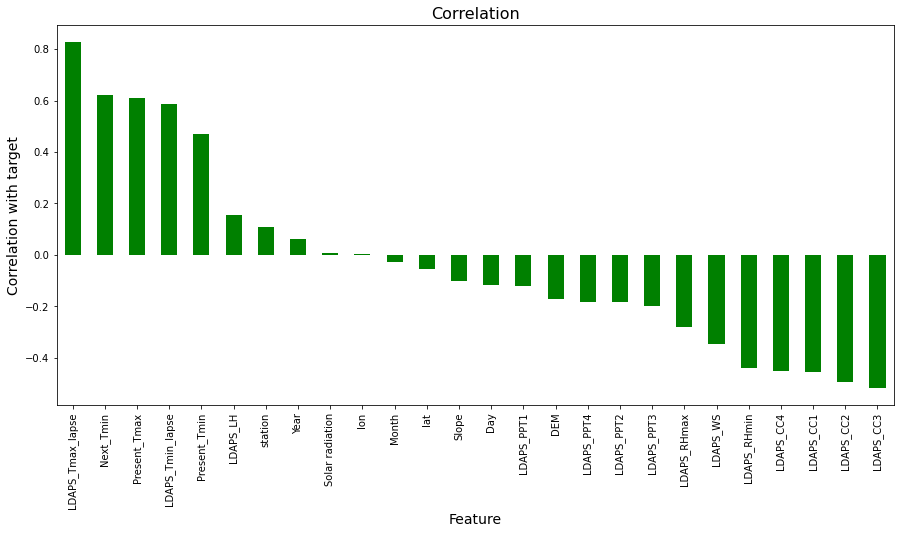

In [24]:
# Checking correlation with Next_Tmax

plt.figure(figsize=(15,7))
z=corr_matrix['Next_Tmax'].sort_values(ascending=False)
z.drop(['Next_Tmax']).plot(kind='bar',color='g')

plt.xlabel('Feature',fontsize=14)
plt.ylabel('Correlation with target',fontsize=14)
plt.title('Correlation',fontsize=16)
plt.show()

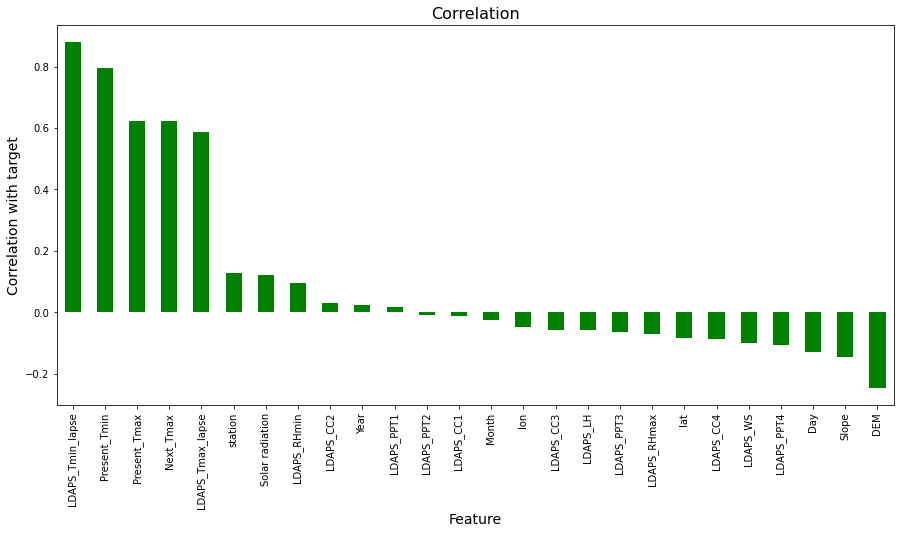

In [25]:
# Checking correlation with Next_Tmin

plt.figure(figsize=(15,7))
z=corr_matrix['Next_Tmin'].sort_values(ascending=False)
z.drop(['Next_Tmin']).plot(kind='bar',color='g')

plt.xlabel('Feature',fontsize=14)
plt.ylabel('Correlation with target',fontsize=14)
plt.title('Correlation',fontsize=16)
plt.show()

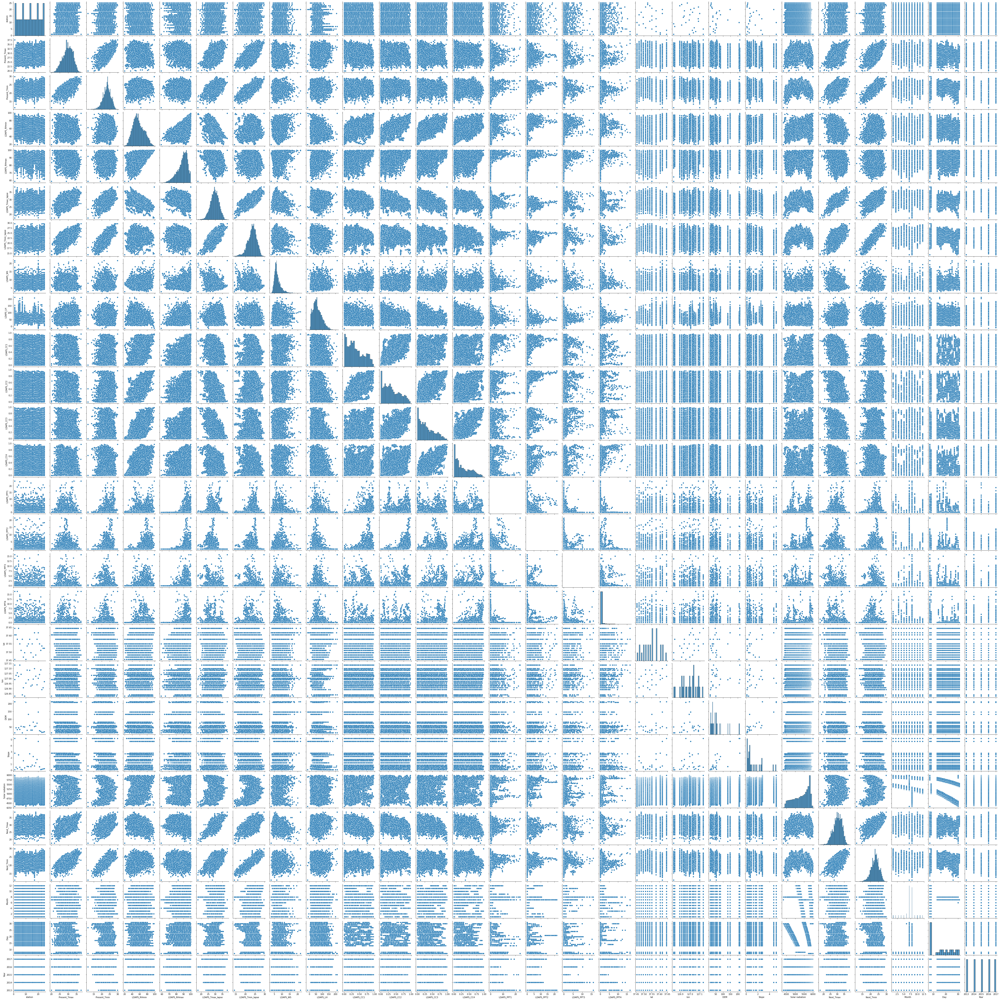

In [26]:
sns.pairplot(data,palette='deep')

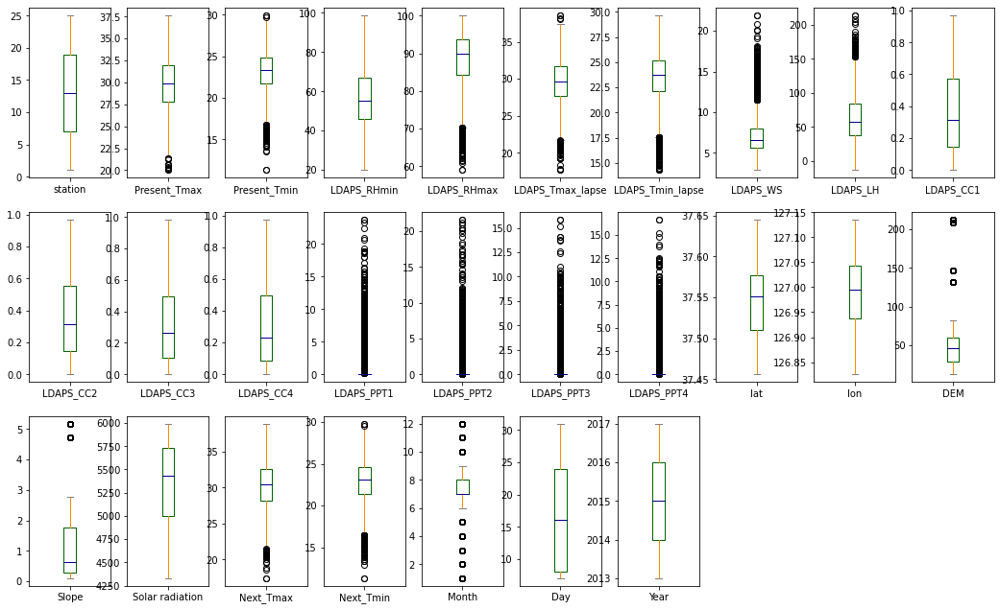

In [27]:
#Checking for outliers

color = dict(boxes='DarkGreen', whiskers='DarkOrange',medians='DarkBlue', caps='Gray')

data.plot(kind='box',subplots=True,layout=(4,10),figsize=(18,15),color=color)
plt.show()

In [28]:
## dataset has many outliers.
## Hence Removing outliers

from numpy import percentile
data_new=data
data_new.shape
att_=att_ = ['Present_Tmax', 'Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 
             'LDAPS_WS','LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM', 'Slope',
            'Next_Tmax', 'Next_Tmin', 'Month']
array=[None]*len(att_)
for x,i in enumerate(att_):
    q25,q75=percentile(data[i],25),percentile(data[i],75)
    iqr=q75-q25
    cut_off=iqr*1.5
    lower,upper=q25-cut_off,q75+cut_off
    array[x]=[i,lower,upper]
    data_new[i]=data_new[i].apply(lambda x: lower if x<lower else (upper if x>upper else x))

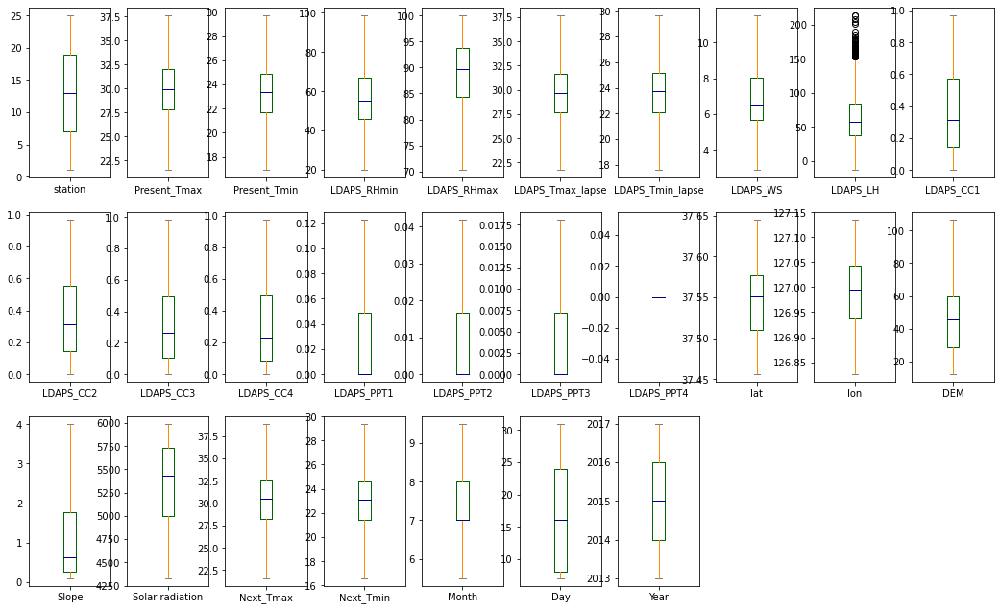

In [29]:
#Checking for outliers

color = dict(boxes='DarkGreen', whiskers='DarkOrange',medians='DarkBlue', caps='Gray')

data_new.plot(kind='box',subplots=True,layout=(4,10),figsize=(18,15),color=color)
plt.show()

In [30]:
data_new.skew()

station             0.000100
Present_Tmax       -0.254865
Present_Tmin       -0.260508
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.738707
LDAPS_Tmax_lapse   -0.167218
LDAPS_Tmin_lapse   -0.412508
LDAPS_WS            0.821284
LDAPS_LH            0.678315
LDAPS_CC1           0.465003
LDAPS_CC2           0.477041
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          1.169230
LDAPS_PPT2          1.170098
LDAPS_PPT3          1.175624
LDAPS_PPT4          0.000000
lat                 0.087062
lon                -0.285213
DEM                 0.729689
Slope               1.181127
Solar radiation    -0.511210
Next_Tmax          -0.301657
Next_Tmin          -0.285882
Month               0.055070
Day                 0.245892
Year                0.000365
dtype: float64

In [31]:
## removing skewness for attributes having gretaer than +/-0.5 value

skew_data=('LDAPS_RHmax','LDAPS_WS','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_CC3')

for data in skew_data:
    data_new[data]=np.log1p(data_new[data])

In [32]:
#dropping features that donot effect output variable much and also has less correlation
data_new.drop(['Day','Month','Year','lat','lon','Slope','DEM'],axis=1,inplace=True)
data_new.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,4.523053,28.074101,23.006936,2.056542,69.451805,0.233947,0.203896,0.149882,0.130928,0.0,0.0,0.0,0.0,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,4.517483,29.850689,24.035009,1.900896,51.937448,0.225508,0.251771,0.147941,0.127727,0.0,0.0,0.0,0.0,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,4.442340,30.091292,24.565633,1.965464,20.573050,0.209344,0.257469,0.185725,0.142125,0.0,0.0,0.0,0.0,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,4.579685,29.704629,23.326177,1.894624,65.727144,0.216372,0.226002,0.149417,0.134249,0.0,0.0,0.0,0.0,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,4.512563,29.113934,23.486480,1.907318,107.965535,0.151407,0.249995,0.164575,0.170021,0.0,0.0,0.0,0.0,5859.552246,31.2,22.5


In [33]:
#Splitting input and target variable(Next_Tmax and Next_Tmin)

input_var=data_new.iloc[:,:-2]
target_Next_Tmax = data_new.iloc[:,[-2]]
target_Next_Tmin = data_new.iloc[:,[-1]]

In [34]:
print('Shape of original data:',data_new.shape,'\n')
print('Shape of input and target variable after splitting---->\n')
print('Shape of input variable :',input_var.shape)
print('Shape of target_Next_Tmax variable :',target_Next_Tmax.shape)
print('Shape of target_Next_Tmin variable :',target_Next_Tmin.shape)

Shape of original data: (7752, 20) 

Shape of input and target variable after splitting---->

Shape of input variable : (7752, 18)
Shape of target_Next_Tmax variable : (7752, 1)
Shape of target_Next_Tmin variable : (7752, 1)


In [35]:
#lets bring all features of input to a common scale

from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler()
input=sc.fit_transform(input_var)



input=pd.DataFrame(input,columns=input_var.columns)
input.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,Solar radiation
0,0.000000,0.447205,0.351562,0.488518,0.736289,0.398868,0.450510,0.599175,0.365853,0.241862,0.210559,0.218803,0.134325,0.0,0.0,0.0,0.0,1.000000
1,0.041667,0.645963,0.367188,0.412406,0.720336,0.510163,0.535943,0.465956,0.288703,0.233137,0.260000,0.215969,0.131041,0.0,0.0,0.0,0.0,0.925703
2,0.083333,0.627329,0.500000,0.367024,0.505108,0.525236,0.580037,0.521220,0.150545,0.216426,0.265884,0.271128,0.145813,0.0,0.0,0.0,0.0,0.922242
3,0.125000,0.652174,0.507812,0.488316,0.898499,0.501013,0.477039,0.460587,0.349446,0.223692,0.233388,0.218125,0.137732,0.0,0.0,0.0,0.0,0.918280
4,0.166667,0.614907,0.390625,0.462078,0.706243,0.464009,0.490360,0.471452,0.535505,0.156529,0.258165,0.240253,0.174432,0.0,0.0,0.0,0.0,0.919835


In [36]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Lasso,Ridge,BayesianRidge,ElasticNet,HuberRegressor,LinearRegression,LogisticRegression,SGDRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [37]:
#Finding out best random state for target_Next_Tmax

from sklearn.linear_model import  LinearRegression
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train_max,y_test_max=train_test_split(input,target_Next_Tmax,test_size=.30,random_state=i)
    mod_max=LinearRegression()
    mod_max.fit(x_train,y_train_max)
    pred=mod_max.predict(x_test)
    acc=r2_score(y_test_max,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best Accuracy is : ',maxAccu,'on random state :' ,maxRS)

Best Accuracy is :  0.7752465357644999 on random state : 63


In [39]:
#Finding out best random state target_Next_Tmin

from sklearn.linear_model import  LinearRegression
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train_min,y_test_min=train_test_split(input,target_Next_Tmin,test_size=.30,random_state=i)
    mod_min=LinearRegression()
    mod_min.fit(x_train,y_train_min)
    pred=mod_min.predict(x_test)
    acc=r2_score(y_test_min,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best Accuracy is : ',maxAccu,'on random state :' ,maxRS)

Best Accuracy is :  0.834275503149634 on random state : 84


In [40]:
x_train,x_test,y_train_max,y_test_max=train_test_split(input,target_Next_Tmax,test_size=.30,random_state=63)

x_train,x_test,y_train_min,y_test_min=train_test_split(input,target_Next_Tmin,test_size=.30,random_state=84)

In [41]:
print('Shape of input variable :',input.shape)
print('------------------------------------------------------------------------------------------------------------------')
print('Shape of training and testing set for target_Next_Tmax-----> ','\n')

print('Shape of input - training set :', x_train.shape)
print('Shape of output - training set :', y_train_max.shape)
print('Shape of input - testing set :', x_test.shape)
print('Shape of output - testing set :', y_test_max.shape)
print('------------------------------------------------------------------------------------------------------------------')
print('\nShape of training and testing set for target_Next_Tmin----->','\n')
print('Shape of input - training set :', x_train.shape)
print('Shape of output - training set :', y_train_min.shape)
print('Shape of input - testing set :', x_test.shape)
print('Shape of output - testing set :', y_test_min.shape)

Shape of input variable : (7752, 18)
------------------------------------------------------------------------------------------------------------------
Shape of training and testing set for target_Next_Tmax----->  

Shape of input - training set : (5426, 18)
Shape of output - training set : (5426, 1)
Shape of input - testing set : (2326, 18)
Shape of output - testing set : (2326, 1)
------------------------------------------------------------------------------------------------------------------

Shape of training and testing set for target_Next_Tmin-----> 

Shape of input - training set : (5426, 18)
Shape of output - training set : (5426, 1)
Shape of input - testing set : (2326, 18)
Shape of output - testing set : (2326, 1)


In [42]:
models_max = [['DecisionTree_max :',DecisionTreeRegressor()],
               ['RandomForest_max :',RandomForestRegressor()],
               ['KNeighbours :', KNeighborsRegressor(n_neighbors = 2)],
               ['SVM_max :', SVR()],
               ['AdaBoostClassifier_max :', AdaBoostRegressor()],
               ['GradientBoostingRegressor_max: ', GradientBoostingRegressor()],
               ['Xgboost_max: ', XGBRegressor()],
               ['Lasso_max: ', Lasso()],
               ['Ridge_max: ', Ridge(random_state=6)],
               ['BayesianRidge_max: ', BayesianRidge()],
               ['ElasticNet_max: ', ElasticNet()],
               ['HuberRegressor_max: ', HuberRegressor()]]

In [43]:
models_min = [['DecisionTree_min :',DecisionTreeRegressor()],
               ['RandomForest_min :',RandomForestRegressor()],
               ['KNeighbours_min :', KNeighborsRegressor(n_neighbors = 2)],
               ['SVM_min :', SVR()],
               ['AdaBoostClassifier_min :', AdaBoostRegressor()],
               ['GradientBoostingRegressor_min: ', GradientBoostingRegressor()],
               ['Xgboost_min: ', XGBRegressor()],
               ['Lasso_min: ', Lasso()],
               ['Ridge_min: ', Ridge(random_state=6)],
               ['BayesianRidge_min: ', BayesianRidge()],
               ['ElasticNet_min: ', ElasticNet()],
               ['HuberRegressor_min: ', HuberRegressor()]]

In [44]:
print("Mean Square Errors for target_Next_Tmax---->")
print('\n')

for name,model in models_max:
    model = model
    model.fit(x_train, y_train_max)
    predictions = model.predict(x_test)
    print(name, (np.sqrt(mean_squared_error(y_test_max, predictions))))

Mean Square Errors for target_Next_Tmax---->


DecisionTree_max : 4.387212500290103
RandomForest_max : 3.238716735688274
KNeighbours : 3.7863499577513893
SVM_max : 3.191567622492299
AdaBoostClassifier_max : 3.1789330312346555
GradientBoostingRegressor_max:  3.2051476299260258
Xgboost_max:  3.418549563380016
Lasso_max:  3.161936055226787
Ridge_max:  3.166543793035411
BayesianRidge_max:  3.1628568374054162
ElasticNet_max:  3.161936055226787
HuberRegressor_max:  3.1697359705976136


In [45]:
print("r2 Square/Accuracy Score for target_Next_Tmax----->")
print('\n')


for name,model in models_max:
    model = model
    model.fit(x_train, y_train_max)
    predictions = model.predict(x_test)
    print(name, (r2_score(y_test_max, predictions))*100)

r2 Square/Accuracy Score for target_Next_Tmax----->


DecisionTree_max : -92.4357787073441
RandomForest_max : -3.8526301800946516
KNeighbours : -43.41165494847481
SVM_max : -1.894571076324847
AdaBoostClassifier_max : -2.8731964289976597
GradientBoostingRegressor_max:  -2.7366836331951916
Xgboost_max:  -16.903282532805484
Lasso_max:  -0.011308602995563355
Ridge_max:  -0.30300435497851996
BayesianRidge_max:  -0.06956534032573902
ElasticNet_max:  -0.011308602995563355
HuberRegressor_max:  -0.5053362406811424


In [46]:
print('Cross_val_scores for target_Next_Tmax:')
print('\n')

names_max=[]
predictions_max=[]


for name,model in models_max:
    result=cross_val_score(model,input,target_Next_Tmax,cv=5,scoring='r2')
    predictions_max.append(result)
    names_max.append(name)
    result="%s : %f (%f)"%(name,result.mean()*100,result.std())
    print(result)

Cross_val_scores for target_Next_Tmax:


DecisionTree_max : : 42.910961 (0.121508)
RandomForest_max : : 67.907384 (0.066442)
KNeighbours : : 47.168736 (0.070997)
SVM_max : : 64.925813 (0.063100)
AdaBoostClassifier_max : : 64.367260 (0.045719)
GradientBoostingRegressor_max:  : 69.580770 (0.050785)
Xgboost_max:  : 64.768898 (0.071721)
Lasso_max:  : -4.243983 (0.045419)
Ridge_max:  : 69.497648 (0.052285)
BayesianRidge_max:  : 69.464131 (0.051871)
ElasticNet_max:  : -3.779737 (0.047703)
HuberRegressor_max:  : 70.018651 (0.053705)


In [47]:
print("Mean Square Errors for target_Next_Tmin---->")
print('\n')

for name,model in models_min:
    model = model
    model.fit(x_train, y_train_min)
    predictions = model.predict(x_test)
    print(name, (np.sqrt(mean_squared_error(y_test_min, predictions))))

Mean Square Errors for target_Next_Tmin---->


DecisionTree_min : 1.152097094361792
RandomForest_min : 0.7930823985323063
KNeighbours_min : 1.0034917425783312
SVM_min : 0.868748775739401
AdaBoostClassifier_min : 1.0826638619877398
GradientBoostingRegressor_min:  0.8471158952113287
Xgboost_min:  0.6847292632376232
Lasso_min:  2.48145972620889
Ridge_min:  1.0099937481343875
BayesianRidge_min:  1.009779937275353
ElasticNet_min:  2.48145972620889
HuberRegressor_min:  1.009722740501842


In [48]:
print("r2 Square/Accuracy Score for target_Next_Tmin----->")
print('\n')


for name,model in models_min:
    model = model
    model.fit(x_train, y_train_min)
    predictions = model.predict(x_test)
    print(name, (r2_score(y_test_min, predictions))*100)

r2 Square/Accuracy Score for target_Next_Tmin----->


DecisionTree_min : 78.62496648845418
RandomForest_min : 89.90975975789468
KNeighbours_min : 83.63108144631485
SVM_min : 87.73180154624353
AdaBoostClassifier_min : 81.38644934100444
GradientBoostingRegressor_min:  88.32082613692874
Xgboost_min:  92.37868066858866
Lasso_min:  -0.09372308427555431
Ridge_min:  83.41827331304614
BayesianRidge_min:  83.42529311483517
ElasticNet_min:  -0.09372308427555431
HuberRegressor_min:  83.4271707376151


In [49]:
print('Cross_val_scores for target_Next_Tmin:')
print('\n')

names_min=[]
predictions_min=[]


for name,model in models_min:
    result=cross_val_score(model,input,target_Next_Tmin,cv=5,scoring='r2')
    predictions_min.append(result)
    names_min.append(name)
    result="%s : %f (%f)"%(name,result.mean()*100,result.std())
    print(result)

Cross_val_scores for target_Next_Tmin:


DecisionTree_min : : 54.079389 (0.168649)
RandomForest_min : : 75.216369 (0.099661)
KNeighbours_min : : 48.602504 (0.155125)
SVM_min : : 72.351656 (0.087404)
AdaBoostClassifier_min : : 71.524035 (0.091497)
GradientBoostingRegressor_min:  : 77.591135 (0.090318)
Xgboost_min:  : 74.295771 (0.122157)
Lasso_min:  : -16.530460 (0.142678)
Ridge_min:  : 76.866569 (0.081915)
BayesianRidge_min:  : 76.842613 (0.082191)
ElasticNet_min:  : -16.530460 (0.142678)
HuberRegressor_min:  : 76.647157 (0.085422)


In [51]:
### Performing Hyper parameter tuning to increase model performance of HuberRegressor_target_Next_Tmin

            
param_tuning = {
        'epsilon': [1.0, 1000, 10],
        'alpha': [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000],
        'warm_start': [False],
        'fit_intercept' : [True],
        'max_iter': [100,1000,10]
             }

#Create new XGB object
huber = HuberRegressor()

#Use GridsearchCV
GCV = GridSearchCV(estimator = huber,param_grid = param_tuning,cv = 5,n_jobs = -1,verbose = 1)

#Fit the model
best_model = GCV.fit(input,target_Next_Tmin)

#checking for best parameters
GCV.best_params_

Fitting 5 folds for each of 81 candidates, totalling 405 fits


{'alpha': 10,
 'epsilon': 1000,
 'fit_intercept': True,
 'max_iter': 100,
 'warm_start': False}

In [52]:
#Creating Final Model after hyperparameter tuning for HuberRegressor_target_Next_Tmin.

f_mod_min= HuberRegressor(alpha=10, epsilon=1000,fit_intercept=True,max_iter=100,warm_start=False)


f_mod_min.fit(input,target_Next_Tmin)

y_pred = f_mod_min.predict(x_test)

print('root mean squared error for HuberRegressor:',np.sqrt(mean_squared_error(y_test_min,y_pred)))

print('Model accuracy of target_Next_Tmin: ',r2_score(y_test_min, y_pred)*100)

root mean squared error for HuberRegressor: 1.010526971433311
Model accuracy of target_Next_Tmin:  83.40076014127871


#### Model accuracy for target_Next_Tmax is 70.01%
#### Model accuracy for target_Next_Tmin is 83.4%

In [53]:
#saving the model for deployment to client

from joblib import dump, load
dump(f_mod_min, 'target_Next_Tmin_huber.joblib') 


['target_Next_Tmin_huber.joblib']

In [54]:
dump(HuberRegressor ,'target_Next_Tmax.joblib')

['target_Next_Tmax.joblib']